# <font color='lightgreen'>CTR prediction</font>

## Imports

In [ ]:
import pandas as pd
import numpy as np
import joblib
import shap

#connect to drive
from google.colab import drive
# visualisation
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
from pprint import pprint
from scipy.special import softmax
import matplotlib.pyplot as plt

# for dummies
from sklearn import preprocessing
# for scailng and standartization
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
# unbalanced data
from collections import Counter
from imblearn.over_sampling import ADASYN
# for clustring - kmeans
from sklearn.cluster import KMeans
import sklearn
# for pca
from sklearn import decomposition
# for knn
from sklearn.neighbors import NearestNeighbors
# dbscan
from sklearn.cluster import DBSCAN

# Models
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
# HYPEROPT is python library that search through an hyperparameter space of value
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

## functions

In [1]:
# Visualisation of categorial features
def vis_label_dist_categorial_features(df,label_col_name,unique_id_col_name,categorial_col_list,numeric_label_col_name):

  for col in categorial_col_list:
    print("\n feature name: ",col)
    basic_temp_grouped=df.groupby([col])[unique_id_col_name].count().reset_index(name="count")
    print("number of categories: ",basic_temp_grouped.shape[0])
    if(basic_temp_grouped.shape[0]<120): #if not too many features
      display(basic_temp_grouped)
      fig1 = px.bar(basic_temp_grouped.sort_values(by=[col]), x=col, y="count", color=col, title=col+" distrabution",text_auto=True,color_discrete_sequence=px.colors.qualitative.Pastel)
      fig1.show()

      temp_grouped=df.groupby([col,label_col_name])[unique_id_col_name].count().reset_index(name="count")
      temp_grouped[label_col_name]=temp_grouped[label_col_name].astype(str)
      temp_grouped['percent_label'] = 100 * temp_grouped['count'] / temp_grouped.groupby(col)['count'].transform('sum')

      fig2 = px.bar(temp_grouped, x=col, y="percent_label",title="label split per "+col, color=label_col_name, text=temp_grouped['percent_label'],color_discrete_sequence=['salmon','navy'])
      fig2.update_traces(texttemplate='%{text:.4}%')
      fig2.show()
    else:
      temp_grouped_basic_hist=raw_train.groupby([col])[numeric_label_col_name].agg(['count','mean']).reset_index()
      temp_grouped_basic_hist = temp_grouped_basic_hist.rename({'mean': 'percent_true'}, axis=1)
      fig88 = px.histogram(temp_grouped_basic_hist, x="percent_true",title='histogram - number of '+col+"per percent of true clicked")
      fig88.add_vline(x=0.067, line_width=3, line_dash="dash", line_color="black",annotation_text="rate across all data")
      fig88.show()
      fig77 = px.histogram(temp_grouped_basic_hist, x="percent_true", y="count", histfunc='sum',title='sum of count of '+col+' per percent of true clicked')
      fig77.add_vline(x=0.067, line_width=3, line_dash="dash", line_color="black",annotation_text="rate across all data")
      fig77.show()


In [2]:
# Visualisation of numeric features
def vis_label_numeric_features(df,label_col_name,numeric_col_list):
  for col in numeric_col_list:

    print("\n feature name: ",col)
    fig4 = px.box(df, x=label_col_name, y=col, color=label_col_name,color_discrete_sequence=['salmon','navy'],title="Box plot of "+col)
    fig4.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
    fig4.show()

In [ ]:
# standartization - (X-mu)/var in order to make numeric field in normal distrabution with mu =0 and var =1
def data_normalization_scaling(df, training=False):
  num_train=df[['device_height']]

  scaler = preprocessing.StandardScaler().fit(num_train)
  num_train_standartized = scaler.transform(num_train)
  # scaling - make all the numeric features between 0-1
  scaler = MinMaxScaler()
  scaler.fit(num_train_standartized)
  scaled = scaler.transform(num_train_standartized)
  train_scaled = pd.DataFrame(scaled, columns=['device_height'])
  cols = ['op_id','app_id','prefered_banner_pos','prefered_device_version_major','prefered_category','prefered_months','prefered_hour','weekend']
  if training:
    train_unbalanced1 = cols + ['label']
  train_unbalanced1=df[cols]

  return df, train_scaled, train_unbalanced1

In [ ]:
# Evaluation Matrix
def model_accuracy(labels, predictions):
  print("****** Accuracy *********")
  print(accuracy_score(labels , predictions)*100)
  print("****** RUC AUC Score *********")
  print(roc_auc_score(labels, predictions))
  print("****** Classifcation Report *********")
  print(classification_report(labels, predictions))


In [ ]:
def balanced_ts(balanced_df):
  X_balanced = balanced_df.drop('y', axis=1)
  y_balanced = balanced_df['y']
  X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=1)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
  return X_train, X_test, X_val, y_train, y_test, y_val


In [ ]:
def unbalanced_ts(train_data):
  X = train_data.drop('label', axis=1)
  y = train_data['label']
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)
  return X_train, X_test, X_val, y_train, y_test, y_val


In [ ]:
def join_train_valid(X_train, X_val, y_train, y_val):
  X_train = pd.concat([X_train,X_val], ignore_index=True, sort=False)
  y_train = pd.concat([y_train,y_val], ignore_index=True, sort=False)
  return X_train, y_train


In [ ]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))

    evaluation = [( X_train, y_train), ( X_val, y_val)]

    clf.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)


    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [ ]:
def rf_hyperparams_tuning(X_train, y_train):
  rf = RandomForestClassifier()

  print('Parameters currently in use:\n')
  pprint(rf.get_params())

  # Number of trees in random forest
  n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
  # Number of features to consider at every split
  max_features = ['auto', 'sqrt']
  # Maximum number of levels in tree
  max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
  max_depth.append(None)
  # Minimum number of samples required to split a node
  min_samples_split = [2, 5, 10]
  # Minimum number of samples required at each leaf node
  min_samples_leaf = [1, 2, 4]
  # Method of selecting samples for training each tree
  bootstrap = [True, False]
  # Create the random grid
  random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}

  pprint(random_grid)
  # Use the random grid to search for best hyperparameters
  # First create the base model to tune
  # Random search of parameters, using 3 fold cross validation,
  # search across 100 different combinations, and use all available cores
  rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
  # Fit the random search model
  rf_random.fit(X_train, y_train)
  rf_random.best_params_
  # todo: concat the data:
  best_rf = rf_random.best_estimator_
  print(rf_random.best_params_)
  return best_rf

# 1. Data Loading

In [ ]:
drive.mount('/content/drive')
path = "/content/drive/MyDrive/data_files/ctr_dataset_train.csv"
raw_train = pd.read_csv(path)
print("Shape: ",raw_train.shape)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Shape:  (2519056, 14)


In [ ]:
print("Train shape: ",raw_train.shape)
raw_train.head(3)

Train shape:  (2519056, 14)


,op_id,timestamp,state,user_isp,app_id,app_cat,banner_pos,manufacturer,device_model,device_version,device_height,device_width,resolution,clicked
0,448ed944-b0a3-4f8e-9662-fb1202e2777b,1569445326,New Jersey,Comcast Cable,6rm7ag7,games - simulation,top-right,Samsung,SM-G925V,6.0.1,792,1408,True,False
1,3c501ca8-f771-4926-acce-d532f979b8b5,1566517297,Illinois,Verizon Wireless,74193f6,games - card,right,NaN,NaN,7.0,2560,1440,True,False
2,db342130-0f34-4d43-a72c-3c1891eade24,1566375809,California,T-Mobile USA,6549c21,games - puzzle,top-left,NaN,NaN,7.0,1280,720,True,False


## Data Cleaning & Basic Feature Engineering

<u>The new extracted features:</u>

Time features (from timestamp):
- date
- hour
- year
- month
-day of week
- weekend - binary

Categorial features:
- Device major version (from device version)

Numeric fiedls:
- device diagonal (from height and width)

*changing the label to be numeric - 0 (false)/1(true)


In [ ]:
# chagne timestamp into datetime and split into interesting time features
def process_time_features(df):
  df['datetime'] = pd.to_datetime(df['timestamp'],unit='s')
  df['date'] = pd.to_datetime(df['datetime']).dt.date
  df['hour'] = pd.to_datetime(df['datetime']).dt.hour
  df['year'] = pd.to_datetime(df['datetime']).dt.year
  df['month'] = pd.to_datetime(df['datetime']).dt.month
  df['dow']=df['datetime'].dt.day_name()
  df['weekend']=0
  df['weekend'].loc[df['dow'].isin(['Sunday','Saturday'])]=1
  return df

In [ ]:
def process_catgorical(df, train=False):
  # create major version field
  df['device_version_major']=df['device_version'].str.split(pat=".")
  df['device_version_major'] = df['device_version'].apply(lambda x : x[0])
  # calculate diagonal using a^2+b^2=c^2
  df['device_diagonal'] = (((df['device_height']**2) + (df['device_width']**2))**0.5)
  df['device_diagonal'] = df['device_diagonal'].astype(int)
  # change label to be 0/1
  if train:
    df['label']=df['clicked'].replace({False: 0, True: 1})
  return df

In [ ]:
raw_train=process_time_features(raw_train)
raw_train=process_catgorical(raw_train)
raw_train.head(2)

,op_id,timestamp,state,user_isp,app_id,app_cat,banner_pos,manufacturer,device_model,device_version,...,datetime,date,hour,year,month,dow,weekend,device_version_major,device_diagonal,label
0,448ed944-b0a3-4f8e-9662-fb1202e2777b,1569445326,New Jersey,Comcast Cable,6rm7ag7,games - simulation,top-right,Samsung,SM-G925V,6.0.1,...,2019-09-25 21:02:06,2019-09-25,21,2019,9,Wednesday,0,6,1615,0
1,3c501ca8-f771-4926-acce-d532f979b8b5,1566517297,Illinois,Verizon Wireless,74193f6,games - card,right,NaN,NaN,7.0,...,2019-08-22 23:41:37,2019-08-22,23,2019,8,Thursday,0,7,2937,0


# 2. Data Exploration and Visualization
Note: We will handle the unbalanced data later on, after we will explore the data

### Label Distrabution

In [ ]:
fig = px.pie(raw_train, names='clicked',color_discrete_sequence=[ 'salmon', 'navy'],title='Label dist')
fig.update_traces(textposition='inside', textinfo='percent+label')

fig.show()

#### Categorial Features

<u>For each categorial field with low cardinality we are presenting:</u>
1. number of categories
2. a table of the number of rows per category
3. a bar plot of the number of rows per category
4. a stacked bar plot of the distrabution of the label per category

Using 3 we can see how many data points we have per category and make sure our splits are balanced, using 4 we can see if we the feature can create impact on the model and add information (same distrabution of label per all categories will not add information at all)

<u>For each categorial field with high cardinality we are presenting:</u>
1. number of categories
2. simple histogram - presentating the number of categories (for example number of app ids) per their avg rate of true label -ctr. (for exmaple, 6808 app ids have an avg rate of ctr of 0-0.00499) - the broken line in black is the reference line to the general ctr rate
3. complex histogram - present the sum of rows in the categories per avg rate of true label ctr (for example for that 6808 app ids, that had avg ctr od 0-0.00499, we can see that they represent 64.598K records)

Using 2 we can see the distrabution of the categories per the ctr and understand if there are categories that aren't arround the avg ctr and can contribute info to the model, using 3 we can understand how much records actually belong to the categories above (if we don't have a lot of data in those categories than they aren't relevant)


* The differance in the presentation is in order to be able to proparly investigate the graphs

In [ ]:
categurical_col_list1=['state','user_isp','app_id','app_cat','banner_pos','manufacturer','device_model','resolution','device_version_major']

In [ ]:
vis_label_dist_categorial_features(raw_train,"clicked","op_id",categurical_col_list1,"label")


 feature name:  state
number of categories:  51


,state,count
0,Alabama,37576
1,Alaska,2481
2,Arizona,42965
3,Arkansas,15021
4,California,315552
5,Colorado,35596
6,Connecticut,10618
7,Delaware,3328
8,District of Columbia,21474
9,Florida,210513



 feature name:  user_isp
number of categories:  3316



 feature name:  app_id
number of categories:  14315



 feature name:  app_cat
number of categories:  46


,app_cat,count
0,art_and_design,478
1,auto_and_vehicles,1844
2,beauty,814
3,books_and_reference,678
4,business,131
5,comics,1820
6,communication,6
7,dating,146
8,education,14944
9,entertainment,34842



 feature name:  banner_pos
number of categories:  9


,banner_pos,count
0,bottom,260444
1,bottom-left,261692
2,bottom-right,260598
3,center,303523
4,left,303553
5,right,261048
6,top,302920
7,top-left,304202
8,top-right,261076



 feature name:  manufacturer
number of categories:  251



 feature name:  device_model
number of categories:  2256



 feature name:  resolution
number of categories:  1


,resolution,count
0,True,2519056



 feature name:  device_version_major
number of categories:  8


,device_version_major,count
0,1,3
1,3,4
2,6,480201
3,7,1473929
4,8,548791
5,9,16110
6,O,1
7,P,17


#### Numerical Features

In [ ]:
list_num_cols=['device_height','device_width','device_diagonal']
raw_train[list_num_cols].describe()

For each numeric feature- we are presenting it's distrabution per the label using box plots.

In [ ]:
vis_label_numeric_features(raw_train,'clicked',list_num_cols)

#### Time Features

<u>For each time field  are presenting:</u>
1. number of categories
2. a table of the number of rows per category
3. a bar plot of the number of rows per category (ordered by time)
4. a stacked bar plot of the distrabution of the label per category (ordered by time)

Using 3 we can see how many data points we have per category and make sure our splits are balanced, using 4 we can see if we the feature can create impact on the model and add information (same distrabution of label per all categories will not add information at all)

In [ ]:
list_of_time_cols=['year','month','hour','date','dow','weekend']

In [ ]:
vis_label_dist_categorial_features(raw_train,"clicked","op_id",list_of_time_cols,'label')

# 3. Missing Values:
Check for nulls in the data:

In [ ]:
raw_train.isna().sum()

As we learned in the class we will fill the empty values with the most common values per this column

In [ ]:
raw_train.user_isp.value_counts()

In [ ]:
raw_train.device_model.value_counts()

In [ ]:
raw_train.manufacturer.value_counts()

In [ ]:
raw_train.user_isp=raw_train.user_isp.fillna('T-Mobile USA')
raw_train.device_model=raw_train.device_model.fillna('LM-X210(G)')
raw_train.manufacturer=raw_train.manufacturer.fillna('Samsung')

# 4. Feature selection & Advanced feature engineering

### Advanced feature engineering

Unify categories together in order to:
1. Convert the categorial features into numeric and reduce dimensions (avoiding dummies features that will increase the dimension)
2. improve performance of the feature (categories with high AVG CTR will be together - value 1,  categories with low AVG CTR will be together - value 0)

In [ ]:
raw_train = feature_engineering(raw_train)

#### Visualize the change
 how the feature engineering has effected the label distrabution (does the feature contribute more?)

In [ ]:
vis_label_dist_categorial_features(raw_train,"clicked","op_id",['prefered_banner_pos','prefered_device_version_major','state_performance','prefered_category','prefered_months','prefered_hour'],"label")

### Features Selection

Based on the visualisations, if we can see differentiation in the avg CTR among the the different values then the feature is relevant

<u>Non relevant features:</u>
- Resolution - all the field’s value is “true” so it won’t contribute anything to the model
- dates, dow, diagonal, width aren’t really relevant based on distributions
- user_isp, manufacturer, deviece_, model are less relevant as most of the the data is around the avg CTR


<u>Relevant features:</u>
- Weekend
- height
- prefered_banner_pos
- prefered_device_version_major
- state_performance
- prefered_category
- prefered_months
- prefered_hour
- App_id - the distrabution per CTR seems relevant. But as we saw in the class- high cardinalty features can negatively influance tree-based models since they can’t handle such high cardinality (too many values for dummies). Therefore- we won't use this feature.




# 5. Data Normalization:

#### Normalize & Scale data

In [ ]:
raw_train, train_scaled, train_unbalanced1 = data_normalization_scaling(raw_train, training=True)

### Concat categorial and numerical

In [ ]:
train_unbalanced = pd.concat([train_scaled, train_unbalanced1], axis=1, sort=False)

## Correlation Matrix

In [ ]:
corr_matrix = train_unbalanced.corr()
print(corr_matrix)

as we can see in the correlaction matrix, our features are not correlated meaning there are no dependencies between them.

In [ ]:
fig = px.imshow(corr_matrix, text_auto=True)
fig.show()

In [ ]:
# #Export prepared data
# train_unbalanced.to_csv('clean_unbalanced_part_1.csv')
# !cp clean_sampled_train.csv "/content/drive/MyDrive/intro to data science/project/data_files/clean_unbalanced_part_1.csv"

## Handeling Unbalanced Data : ADASYN



As seen tin the first visualisation the data is unbalanced, we choose to use ADASYN model in order to balance it.
We selected ADASYN since it is more accurate method for oversampling based on probabilitues- how is it challenging for the model to classify those under represented examples.

In [ ]:
cols=train_unbalanced.columns.tolist()
cols.remove('label')
cols.remove('app_id')
cols.remove('op_id')
X_unbalanced=train_unbalanced[cols]
y_unbalanced=train_unbalanced['label']

In [ ]:
print('Original dataset shape %s' % Counter(y_unbalanced))

In [ ]:
ada = ADASYN(random_state=42,n_neighbors=3)
#auto startegy is sample all none major class (since we only have 2 classes it will sample only the minorirty)
X_balanced, y_balanced = ada.fit_resample(X_unbalanced,y_unbalanced)

In [ ]:
print('Resampled dataset shape %s' % Counter(y_balanced))

In [ ]:
balanced_df=X_balanced
balanced_df['y']=y_balanced

In [ ]:
balanced_df.to_csv('/content/drive/MyDrive/data_files/clean_balanced_df.csv')
train_unbalanced.to_csv('/content/drive/MyDrive/data_files/unbalanced_df.csv')

# 6. Training:

Split: Train (0.6), Valid (0.2) Test (0.2)

In [ ]:
balanced_df = pd.read_csv('/content/drive/MyDrive/data_files/balanced_df.csv')
print(balanced_df.shape)
print(balanced_df.columns)
train_unbalanced = pd.read_csv('/content/drive/MyDrive/data_files/train_unbalanced.csv')
print(train_unbalanced.shape)

In [ ]:
train_data = train_unbalanced.drop('op_id',axis=1)
train_data = train_data.drop('app_id',axis=1)
train_data = train_data.dropna()

## Modeling:
- We choose to try 3 models: KNN, XGboost and Random Forest
- For each model we will perform hyperparams optimization
- Also we will show how the models are perfoming when the data in unbalanced

### KNN

In [ ]:
X_train, X_test, X_val, y_train, y_test, y_val = unbalanced_ts(train_data)
X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)

knn = KNeighborsClassifier(n_neighbors=7)

print("*********** Fitting **************")
knn.fit(X_train, y_train)

print("*********** Predicting **************")
preds = knn.predict(X_test)

print("*********** Eveluating **************")
model_accuracy(y_test, preds)

*********** Fitting **************
*********** Predicting **************
*********** Eveluating **************
****** Accuracy *********
93.20816356411271
****** RUC AUC Score *********
0.4999299169433885
****** Classifcation Report *********
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96    407649
         1.0       0.05      0.00      0.00     29464

    accuracy                           0.93    437113
   macro avg       0.49      0.50      0.48    437113
weighted avg       0.87      0.93      0.90    437113



- As we can see with unbalanced data the classifier predict the same all the time
- For hyperparameters tuning,we will tune the K with the elbow method

In [ ]:
error_rate = []
for i in range(1,10):
 print(i)
 knn = KNeighborsClassifier(n_neighbors=i)
 knn.fit(X_train,y_train)
 pred_i = knn.predict(X_test)
 error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

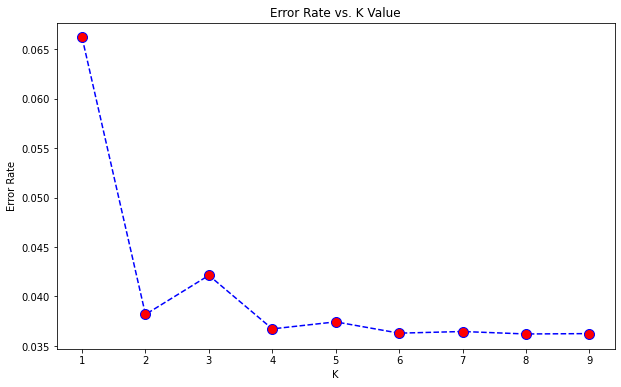

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,10),error_rate,color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title("Error Rate vs. K Value")
plt.xlabel("K")
plt.ylabel("Error Rate")

With Optimal K

In [ ]:
k_optimal = 4

In [ ]:
X_balanced = balanced_df.drop('y', axis=1)
y_balanced = balanced_df['y']
X_train, X_test, y_train, y_test = train_test_split(
             X_balanced, y_balanced, test_size = 0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors=k_optimal)

print("*********** Fitting **************")
knn.fit(X_train, y_train)

print("*********** Predicting **************")
preds = knn.predict(X_test)

print("*********** Eveluating **************")
model_accuracy(y_test, preds)

*********** Fitting **************
*********** Predicting **************
*********** Eveluating **************
****** Accuracy *********
96.32757987513772
****** RUC AUC Score *********
0.9634484319446951
****** Classifcation Report *********
              precision    recall  f1-score   support

           0       0.93      1.00      0.96    468781
           1       1.00      0.93      0.96    473377

    accuracy                           0.96    942158
   macro avg       0.97      0.96      0.96    942158
weighted avg       0.97      0.96      0.96    942158



### XGboost

In [ ]:
space={'max_depth': hp.quniform("max_depth", 3, 18, 1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_alpha' : hp.quniform('reg_alpha', 40,180,1),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': 180,
        'seed': 0
    }

In [ ]:
X_train, X_test, X_val, y_train, y_test, y_val = unbalanced_ts(train_data)
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 10,
                        trials = trials)

In [ ]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.5426794216803918, 'gamma': 1.8020990589086692, 'max_depth': 7.0, 'min_child_weight': 7.0, 'reg_alpha': 129.0, 'reg_lambda': 0.40433259716710235}


In [ ]:
X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)

#### The parameters we decdided to tune are:
- Gamma: Increasing this value will make the model more conservative in making splits, which may help prevent overfitting.
- reg_alpha: L1 regularization will increase the sparsity of the model and make it more robust to irrelevant features.
- reg_lambda: L2 regularization will make the model more robust to irrelevant features.
- min_child_weight: This value helps control overfitting
- colsample_bytree: The fraction of the features to be used for training each tree. A smaller value will make the model more robust to irrelevant features but may lead to underfitting.
- max_depth: The maximum depth of the tree will make the model more complex and may lead to overfitting.

In [ ]:
xg_reg = xgb.XGBClassifier(objective ='reg:linear', colsample_bytree=best_hyperparams['colsample_bytree'],
                          gamma=best_hyperparams['gamma'], max_depth=int(best_hyperparams['max_depth']),
                          min_child_weight=best_hyperparams['min_child_weight'], reg_alpha=best_hyperparams['reg_alpha'],
                          reg_lambda=best_hyperparams['reg_lambda'])
print("Fitting")
xg_reg.fit(X_train,y_train)
print("Predicting")
preds = xg_reg.predict(X_test)

In [ ]:
model_accuracy(y_test, preds)

****** Accuracy *********
93.20024135987234
****** RUC AUC Score *********
0.5
****** Classifcation Report *********
              precision    recall  f1-score   support

           0       0.93      1.00      0.96    469554
           1       0.00      0.00      0.00     34258

    accuracy                           0.93    503812
   macro avg       0.47      0.50      0.48    503812
weighted avg       0.87      0.93      0.90    503812



- We can see that for unbalanced data the classifier tends to predict always the majority class and therefor we got great classifier for the majority class 0, but very bad classifer for the minority class 1.

#### XGboost With balanced data:

In [ ]:
balanced_df['y'].value_counts()

1    2362292
0    2348498
Name: y, dtype: int64

In [ ]:
X_balanced = balanced_df.drop('y', axis=1)
y_balanced = balanced_df['y']
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 30,
                        trials = trials)



In [ ]:
X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)
xg_reg = xgb.XGBClassifier(objective ='reg:linear', colsample_bytree=best_hyperparams['colsample_bytree'],
                          gamma=best_hyperparams['gamma'], max_depth=int(best_hyperparams['max_depth']),
                          min_child_weight=best_hyperparams['min_child_weight'], reg_alpha=best_hyperparams['reg_alpha'],
                          reg_lambda=best_hyperparams['reg_lambda'])
print("Fitting")
xg_reg.fit(X_train,y_train)
print("Predicting")
preds = xg_reg.predict(X_test)
model_accuracy(y_test, preds)

Fitting
[10:09:50] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Predicting
****** Accuracy *********
78.3124486551088
****** RUC AUC Score *********
0.7823016415075756
****** Classifcation Report *********
              precision    recall  f1-score   support

           0       0.98      0.57      0.73    469210
           1       0.70      0.99      0.82    472948

    accuracy                           0.78    942158
   macro avg       0.84      0.78      0.77    942158
weighted avg       0.84      0.78      0.77    942158



### Random Forest

#### Hyper params optimization for RF:
- we will optimize: Number of trees, features amount, Depth pf each tree, leaf nodes, and split nodes.

In [ ]:
X_train, X_test, X_val, y_train, y_test, y_val = balanced_ts(balanced_df)
best_rf = rf_hyperparams_tuning(X_train, y_train)
X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}
{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [ ]:
rf = best_rf

In [ ]:
print(balanced_df.columns)
X_train, X_test, X_val, y_train, y_test, y_val = balanced_ts(balanced_df)

X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)

best_rf = RandomForestClassifier(n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features='sqrt', max_depth=50, bootstrap=True)
print("*********** Fitting **************")
best_rf.fit(X_train,y_train)
print("*********** Predicting **************")
preds = best_rf.predict(X_test)
print("*********** Eveluating **************")
model_accuracy(y_test, preds)

Index(['Unnamed: 0', 'device_height', 'prefered_banner_pos',
       'prefered_device_version_major', 'prefered_category', 'prefered_months',
       'prefered_hour', 'weekend', 'y'],
      dtype='object')
*********** Fitting **************
*********** Predicting **************
*********** Eveluating **************
****** Accuracy *********
96.1978776383579
****** RUC AUC Score *********
0.9621088071376898
****** Classifcation Report *********
              precision    recall  f1-score   support

           0       0.93      0.99      0.96    469210
           1       0.99      0.93      0.96    472948

    accuracy                           0.96    942158
   macro avg       0.96      0.96      0.96    942158
weighted avg       0.96      0.96      0.96    942158



#### RF for shap values. we have seen that RF is our best model therefore we will perform SHAP analysis on it
- We will use part of the data  since the SHAP can't handle such big amount of data:

In [ ]:
balanced_df = balanced_df.sample(frac=0.001)
print(balanced_df.shape)
X_train, X_test, X_val, y_train, y_test, y_val = balanced_ts(balanced_df)
X_train, y_train = join_train_valid(X_train, X_val, y_train, y_val)

best_rf = RandomForestClassifier(n_estimators=200, min_samples_split=10, min_samples_leaf=2, max_features='sqrt', max_depth=50, bootstrap=True)
print("*********** Fitting **************")
best_rf.fit(X_train,y_train)
print("*********** Predicting **************")
preds = best_rf.predict(X_test)
print("*********** Eveluating **************")
model_accuracy(y_test, preds)

(4711, 8)
*********** Fitting **************
*********** Predicting **************
*********** Eveluating **************
****** Accuracy *********
75.82184517497349
****** RUC AUC Score *********
0.7587153074535558
****** Classifcation Report *********
              precision    recall  f1-score   support

           0       0.88      0.60      0.71       473
           1       0.70      0.91      0.79       470

    accuracy                           0.76       943
   macro avg       0.79      0.76      0.75       943
weighted avg       0.79      0.76      0.75       943



## Explainable AI:
Explaination for SHAP: SHAP values are a method to explain the output of ML models. They attribute a prediction to each feature of the input, in a way that satisfies a number of desirable properties. The goal of SHAP values is to provide a unified way to understand the contribution of each feature to a specific prediction, taking into account all possible combinations of features. SHAP values can be used for a wide range of models, such as linear models, tree-based models, and deep neural networks.
- Since the dataset is very big and it causes heavy calculations with SHAP, we will shuffle the df and will run the SHAP on a data sample of 100k. It maybe will harm the accuracy of the SHAP, but we hope the sample is representive

In [ ]:
final_model = best_rf

In [ ]:
print("********* Creating SHAP Explainer *********")
explainer = shap.Explainer(final_model.predict, X_test)
print("********* Calculating SHAP values *********")
shap_values = explainer(X_test)

### Plot Global Interpretability:

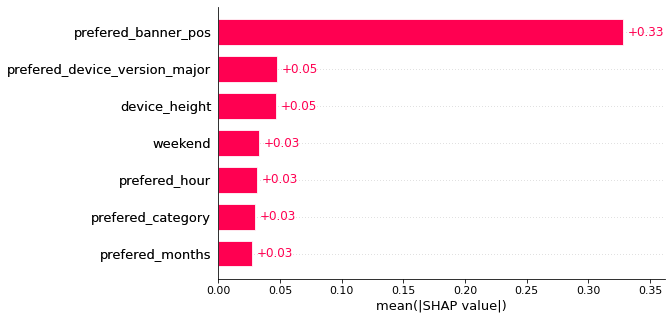

In [ ]:
shap.plots.bar(shap_values)


#### Graph explaination:
- we can see that the most contributing features is the prefered_banner_pos which contribute 33% positive for the prediction. All the rest of the features contributing equaly around 3-5% for the predicition.

#### Summary Plot:
The plot summarizes the average magnitude and direction of the SHAP values for all the samples in a dataset, allowing us to quickly assess the overall impact of each feature on the model's predictions.

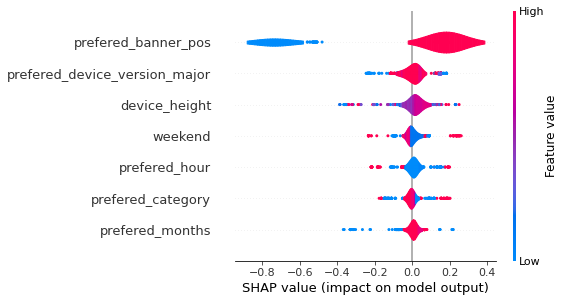

In [ ]:
shap.summary_plot(shap_values, plot_type='violin')


- In this graph we can see that high value of prefered_banner_pos contribute to 1 label- positive purchse of the item. And low number, to negative contribution.
- for the prefered_device_version_major, we can see that high values did not contributed, wheres low numbers contributed in both sides, positive and negative.
- For device height, there is a mix along the range, but we can see that high values are not contributing so much
- Weekend- high values are influencing in both directions, low values are not influencing
- prefered hour - similar to weekend
- prefered category 0 tandecy that high numbers influncing to negative prediction (0)
- preferd month, low values influncing fot negative prediction, and high numbers are mainly to positive direction of the prediction.



### Plot Local Interpretability:
- select 3 random data points and plot indivdual predictions:

*********** Showing plot for index 124 *************


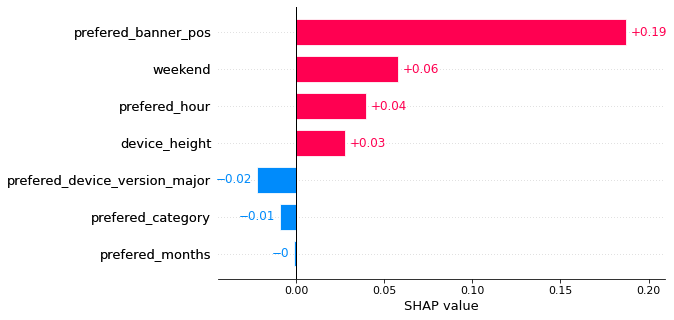

*********** Showing plot for index 46 *************


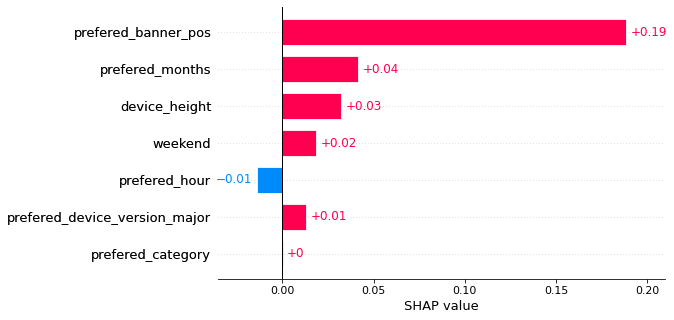

*********** Showing plot for index 207 *************


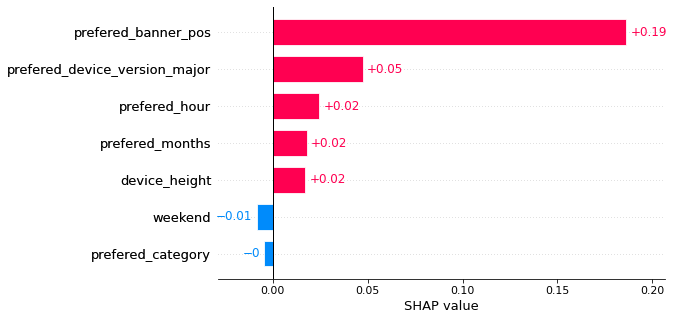

In [ ]:
import random
X = X_test.reset_index()
indices = list(X.index.values)
selected = random.sample(indices, 3)
for i in selected:
  print(f"*********** Showing plot for index {i} *************")
  shap.plots.bar(shap_values[i])


#### Plot 1:
- preferd_banner_pos - High --> positive effect - adding to 1 prediciton
- weekend - medium -->  positive effect
- Prefered_hour - medium -->positive effect
- device_height - low positive --> positive effect
- prefered_device_major_version -> low negative --> influencing negtively
- preferd_category  --> low negative  --> influencing negtively
- prefered_month --> almost 0, almost no influence
#### Plot 2:
- preferd_banner_pos - High --> positive - adding to 1 prediciton
- prefered_month  - High --> positive
- device_height - low positive --> positive
- Prefered_hour - low negative --> negative
- prefered_device_version_major - low positive --> positive effect
- preferd_category  --> almost 0, almost no influence

#### Plot 3:
- preferd_banner_pos - High --> very positive effect
- prefered_device_version_major - medium -->  positive
- Prefered_hour - low positive -->positive
- prefered_month - low positive -->positive
- device_height - low positive --> positive
- weekend -> low number --> influencing negtively
- preferd_category  --> low nmber  --> influencing negtively
